Import setting

In [1]:
!pip install -q zarr gcsfs fsspec xarray

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.colors import LogNorm
import warnings
warnings.filterwarnings("ignore")

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.1/284.1 kB 22.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 146.8 MB/s eta 0:00:00


Import data and clean data

In [2]:
store_url = 'https://ncsa.osn.xsede.org/Pangeo/pangeo-forge/pangeo-forge/AGDC-feedstock/AGCD.zarr'
ds = xr.open_dataset(store_url, engine="zarr", chunks={})

def get_data_scalar(start_year, end_year, is_train=False, stats=None):
    # Select Region & Time
    data = ds[['tmax', 'tmin', 'vapourpres', 'precip']].sel(
        lat=slice(-44.5, -10), lon=slice(112, 156.5), time=slice(start_year, end_year)
    )

    # Coarsen (Factor 4)
    data = data.coarsen(lat=4, lon=4, boundary="trim").mean().compute()

    # Feature Engineering
    doy = data.time.dt.dayofyear
    doy_s = np.sin(2 * np.pi * (doy / 365.0))
    doy_c = np.cos(2 * np.pi * (doy / 365.0))

    # Inputs X
    weights = np.cos(np.deg2rad(data.lat))
    X_vars = ['tmax', 'tmin', 'vapourpres']

    X_list = [data[v].weighted(weights).mean(dim=["lat", "lon"]) for v in X_vars]
    X_list.append(doy_s)
    X_list.append(doy_c)

    X = np.stack([x.values for x in X_list], axis=1)

    # Target y 2D Map
    y = np.log1p(data['precip'].values)

    # Normalize X
    if is_train:
        stats = (X.mean(axis=0), X.std(axis=0))
    X = (X - stats[0]) / stats[1]

    return (
        torch.from_numpy(X.astype(np.float32)),
        torch.from_numpy(y.astype(np.float32)).unsqueeze(1),
        stats,
        data.lat.values,
        data.lon.values,
        data.time.values
    )

# Process Splits
X_train, y_train, stats, lats, lons, times_test = get_data_scalar('1971', '2000', is_train=True)
X_val, y_val, _, _, _, _ = get_data_scalar('2001', '2010', stats=stats)
X_test, y_test, _, _, _, times_test = get_data_scalar('2011', '2019', stats=stats)

# Loaders
BATCH_SIZE = 16
train_dl = DataLoader(TensorDataset(X_train, y_train), batch_size=BATCH_SIZE, shuffle=True)
val_dl   = DataLoader(TensorDataset(X_val, y_val), batch_size=BATCH_SIZE)
test_dl  = DataLoader(TensorDataset(X_test, y_test), batch_size=BATCH_SIZE)

Define model

In [9]:
class CenterCrop(nn.Module):
    def __init__(self, H, W):
        super().__init__(); self.H, self.W = H, W
    def forward(self, x):
        h = (x.shape[2]-self.H)//2; w = (x.shape[3]-self.W)//2
        return x[:,:,h:h+self.H, w:w+self.W]

class Reshape(nn.Module):
    def __init__(self, shape): super().__init__(); self.shape = shape
    def forward(self, x): return x.view(-1, *self.shape)

def make_CNN_model(input_dim):
    H_start, W_start = 22, 28
    return nn.Sequential(
        nn.Linear(input_dim, 32 * H_start * W_start), nn.ReLU(),
        Reshape((32, H_start, W_start)),
        nn.ConvTranspose2d(32, 32, 4, 2, 1), nn.ReLU(),
        nn.ConvTranspose2d(32, 32, 4, 2, 1), nn.ReLU(),
        nn.ConvTranspose2d(32, 32, 4, 2, 1), nn.ReLU(),
        nn.Conv2d(32, 1, 3, padding=1),
        CenterCrop(172, 221)
    )

In [11]:
weights_np = np.cos(np.deg2rad(lats))

weights = torch.from_numpy(weights_np).float().to(DEVICE)
weights = weights.view(1, 1, -1, 1)

In [12]:
# Build models
model_mse = make_CNN_model(5).to(DEVICE)
model_mae = make_CNN_model(5).to(DEVICE)

LR = 3e-4
opt_mse = optim.Adam(model_mse.parameters(), lr=LR)
opt_mae = optim.Adam(model_mae.parameters(), lr=LR)

# weighted losses
def crit_mse(p, t):
    return torch.mean(((p - t) ** 2) * weights)

def crit_mae(p, t):
    return torch.mean(torch.abs(p - t) * weights)

Train model and validation

In [13]:
N_EPOCHS = 100

mse_train_hist, mse_val_hist = [], []
mae_train_hist, mae_val_hist = [], []

print("Training MSE Model")
for epoch in range(N_EPOCHS):
    #  Train
    model_mse.train()
    train_losses = []
    for Xb, yb in train_dl:
        Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)

        opt_mse.zero_grad()
        pred = model_mse(Xb)
        loss = crit_mse(pred, yb)
        loss.backward()
        opt_mse.step()

        train_losses.append(loss.item())
    train_loss = float(np.mean(train_losses))

    #  Validation
    model_mse.eval()
    val_losses = []
    with torch.no_grad():
        for Xb, yb in val_dl:
            Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)
            pred = model_mse(Xb)
            vloss = crit_mse(pred, yb)
            val_losses.append(vloss.item())
    val_loss = float(np.mean(val_losses))

    mse_train_hist.append(train_loss)
    mse_val_hist.append(val_loss)

    print(f"Epoch {epoch+1:02d} | Train MSE: {train_loss:.4f}, Val MSE: {val_loss:.4f}")

print(f"[MSE model] Train Loss: {mse_train_hist[-1]:.4f}, Val Loss: {mse_val_hist[-1]:.4f}")


print("Training MAE Model")
for epoch in range(N_EPOCHS):
    #  Train
    model_mae.train()
    train_losses = []
    for Xb, yb in train_dl:
        Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)

        opt_mae.zero_grad()
        pred = model_mae(Xb)
        loss = crit_mae(pred, yb)
        loss.backward()
        opt_mae.step()

        train_losses.append(loss.item())
    train_loss = float(np.mean(train_losses))

    #  Validation
    model_mae.eval()
    val_losses = []
    with torch.no_grad():
        for Xb, yb in val_dl:
            Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)
            pred = model_mae(Xb)
            vloss = crit_mae(pred, yb)
            val_losses.append(vloss.item())
    val_loss = float(np.mean(val_losses))

    mae_train_hist.append(train_loss)
    mae_val_hist.append(val_loss)

    print(f"Epoch {epoch+1:02d} | Train MAE: {train_loss:.4f}, Val MAE: {val_loss:.4f}")

print(f"[MAE model] Train Loss: {mae_train_hist[-1]:.4f}, Val Loss: {mae_val_hist[-1]:.4f}")

Training MSE Model
Epoch 01 | Train MSE: 0.3285, Val MSE: 0.2953
Epoch 02 | Train MSE: 0.2889, Val MSE: 0.2933
Epoch 03 | Train MSE: 0.2846, Val MSE: 0.2875
Epoch 04 | Train MSE: 0.2827, Val MSE: 0.2869
Epoch 05 | Train MSE: 0.2814, Val MSE: 0.2858
Epoch 06 | Train MSE: 0.2809, Val MSE: 0.2839
Epoch 07 | Train MSE: 0.2800, Val MSE: 0.2868
Epoch 08 | Train MSE: 0.2796, Val MSE: 0.2849
Epoch 09 | Train MSE: 0.2792, Val MSE: 0.2856
Epoch 10 | Train MSE: 0.2787, Val MSE: 0.2834
Epoch 11 | Train MSE: 0.2782, Val MSE: 0.2841
Epoch 12 | Train MSE: 0.2781, Val MSE: 0.2829
Epoch 13 | Train MSE: 0.2780, Val MSE: 0.2830
Epoch 14 | Train MSE: 0.2776, Val MSE: 0.2829
Epoch 15 | Train MSE: 0.2772, Val MSE: 0.2824
Epoch 16 | Train MSE: 0.2773, Val MSE: 0.2829
Epoch 17 | Train MSE: 0.2771, Val MSE: 0.2830
Epoch 18 | Train MSE: 0.2768, Val MSE: 0.2828
Epoch 19 | Train MSE: 0.2768, Val MSE: 0.2838
Epoch 20 | Train MSE: 0.2767, Val MSE: 0.2824
Epoch 21 | Train MSE: 0.2764, Val MSE: 0.2848
Epoch 22 | Trai

Compute rmse

In [14]:
def compute_rmse(model, dataloader, device, weights):
    model.eval()
    se_sum = 0.0
    count = 0
    with torch.no_grad():
        for Xb, yb in dataloader:
            Xb, yb = Xb.to(device), yb.to(device)
            pred = model(Xb)

            sq_err = ((pred - yb) ** 2) * weights

            se_sum += sq_err.sum().item()
            count += pred.numel()   # same normalization as torch.mean
    return np.sqrt(se_sum / count)

print("Weighted RMSE for models")
train_rmse_mae = compute_rmse(model_mae, train_dl, DEVICE, weights)
val_rmse_mae   = compute_rmse(model_mae, val_dl, DEVICE, weights)
test_rmse_mae  = compute_rmse(model_mae, test_dl, DEVICE, weights)

print("\nMAE Model:")
print(f"Train RMSE: {train_rmse_mae:.4f}")
print(f"Val RMSE:   {val_rmse_mae:.4f}")
print(f"Test RMSE:  {test_rmse_mae:.4f}")

train_rmse_mse = compute_rmse(model_mse, train_dl, DEVICE, weights)
val_rmse_mse   = compute_rmse(model_mse, val_dl, DEVICE, weights)
test_rmse_mse  = compute_rmse(model_mse, test_dl, DEVICE, weights)

print("\nMSE Model:")
print(f"Train RMSE: {train_rmse_mse:.4f}")
print(f"Val RMSE:   {val_rmse_mse:.4f}")
print(f"Test RMSE:  {test_rmse_mse:.4f}")

Weighted RMSE for models

MAE Model:
Train RMSE: 0.5539
Val RMSE:   0.5706
Test RMSE:  0.5599

MSE Model:
Train RMSE: 0.5204
Val RMSE:   0.5322
Test RMSE:  0.5230


Plot training history for both models

In [15]:
def plot_histories_side_by_side(mse_train, mse_val, mae_train, mae_val):
    epochs_mse = np.arange(1, len(mse_train) + 1)
    epochs_mae = np.arange(1, len(mae_train) + 1)

    plt.figure(figsize=(16, 6))

    # MSE model
    ax1 = plt.subplot(1, 2, 1)
    plt.plot(epochs_mse, mse_train, label='Train Loss', linewidth=2.5)
    plt.plot(epochs_mse, mse_val,   label='Val Loss', linewidth=2.5)
    plt.title("MSE Model Learning Curve", fontsize=20, pad=15)
    plt.xlabel("Epoch", fontsize=16)
    plt.ylabel("Loss (MSE)", fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.legend(fontsize=14)
    ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

    # MAE model
    ax2 = plt.subplot(1, 2, 2)
    plt.plot(epochs_mae, mae_train, label='Train Loss', linewidth=2.5)
    plt.plot(epochs_mae, mae_val,   label='Val Loss', linewidth=2.5)
    plt.title("MAE Model Learning Curve", fontsize=20, pad=15)
    plt.xlabel("Epoch", fontsize=16)
    plt.ylabel("Loss (MAE)", fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.legend(fontsize=14)
    ax2.xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.tight_layout()
    plt.show()

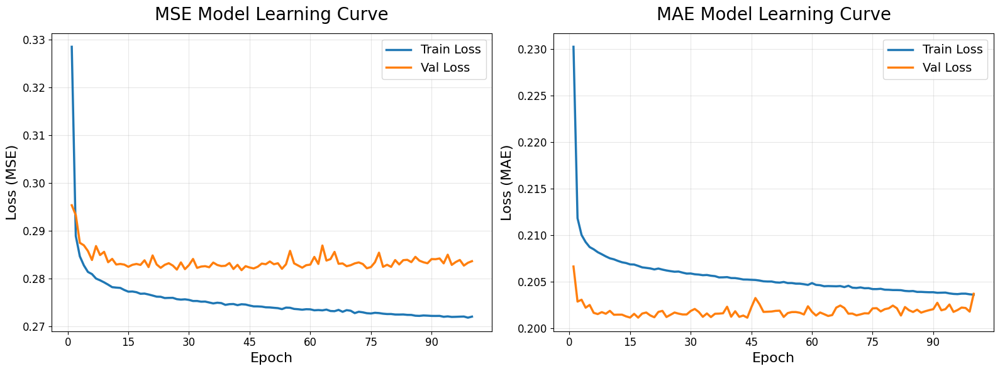

In [16]:
    plot_histories_side_by_side(
    mse_train_hist, mse_val_hist,
    mae_train_hist, mae_val_hist
)

Plot precipitation comparaison (MSE and MAE)

In [20]:
def plot_comparison(date_str):
    # Times from test set
    str_times = np.array([str(t).split('T')[0] for t in times_test])
    idx = np.where(str_times == date_str)[0][0]

    # Select sample
    X_in = X_test[idx].unsqueeze(0).to(DEVICE)
    y_true = y_test[idx].unsqueeze(0)

    # Predictions
    with torch.no_grad():
        p_mse = model_mse(X_in).cpu()
        p_mae = model_mae(X_in).cpu()

    # Back to mm/day
    t_mm = np.expm1(y_true[0, 0].numpy())
    m_mm = np.expm1(p_mse[0, 0].numpy())
    a_mm = np.expm1(p_mae[0, 0].numpy())

    # Robust colorbar from true field
    vmax = np.percentile(t_mm, 95)
    if vmax < 1:
        vmax = 1.0

    fig, ax = plt.subplots(1, 3, figsize=(20, 5))

    # Actual
    im0 = ax[0].imshow(t_mm, cmap='Blues', norm=LogNorm(vmin=0.1, vmax=vmax))
    ax[0].set_title(f"Actual: {date_str}", fontsize=14)
    cbar0 = plt.colorbar(im0, ax=ax[0], fraction=0.046, pad=0.04)
    cbar0.set_label("mm/day (Log)")

    # MSE
    im1 = ax[1].imshow(m_mm, cmap='Blues', norm=LogNorm(vmin=0.1, vmax=vmax))
    ax[1].set_title("MSE Model", fontsize=14)
    cbar1 = plt.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)
    cbar1.set_label("mm/day (Log)")

    # MAE
    im2 = ax[2].imshow(a_mm, cmap='Blues', norm=LogNorm(vmin=0.1, vmax=vmax))
    ax[2].set_title("MAE Model", fontsize=14)
    cbar2 = plt.colorbar(im2, ax=ax[2], fraction=0.046, pad=0.04)
    cbar2.set_label("mm/day (Log)")

    plt.tight_layout()
    plt.show()

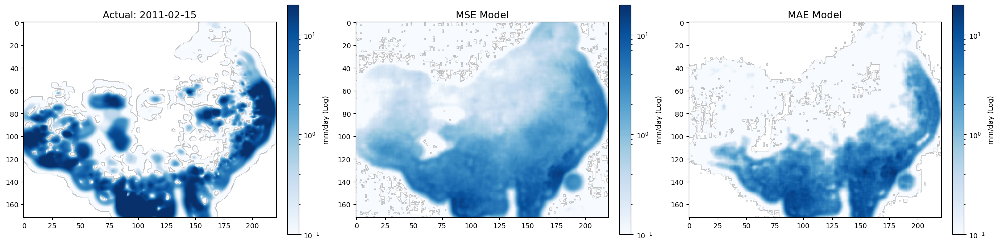

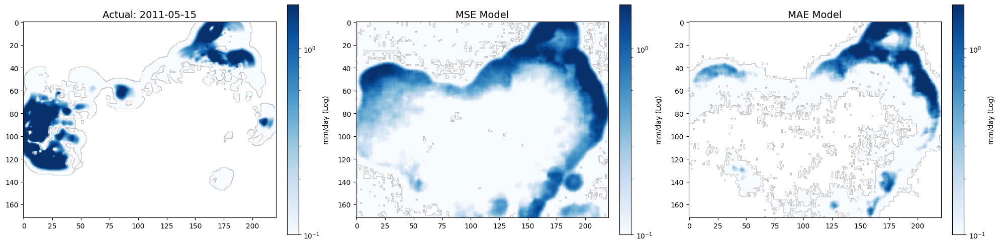

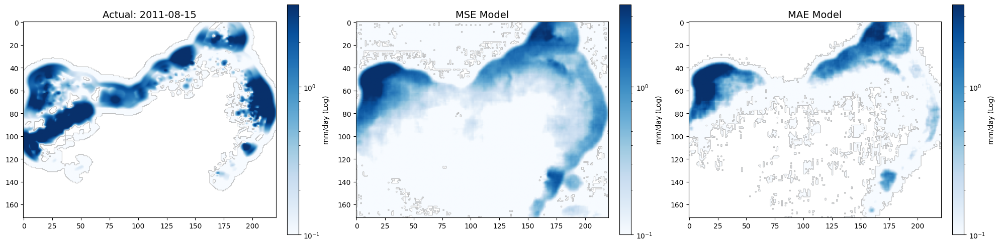

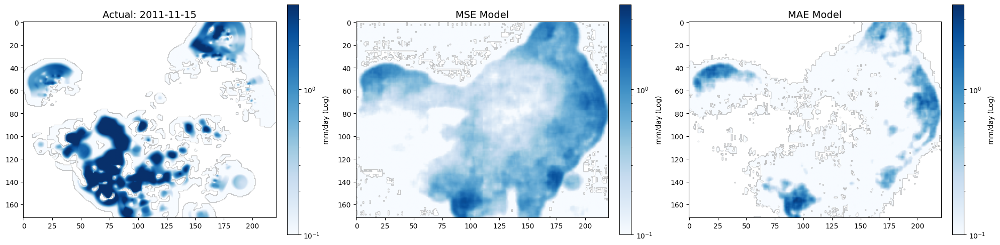

In [21]:
plot_comparison('2011-02-15')
plot_comparison('2011-05-15')
plot_comparison('2011-08-15')
plot_comparison('2011-11-15')

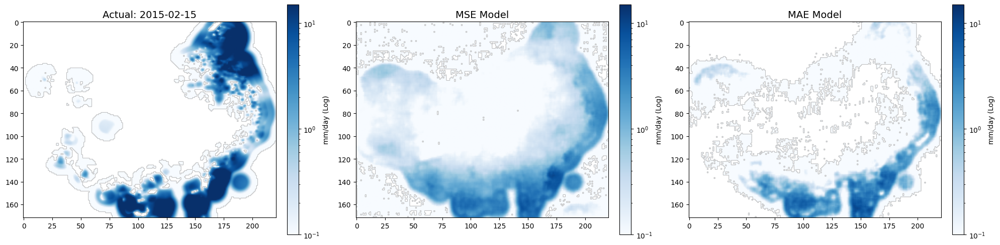

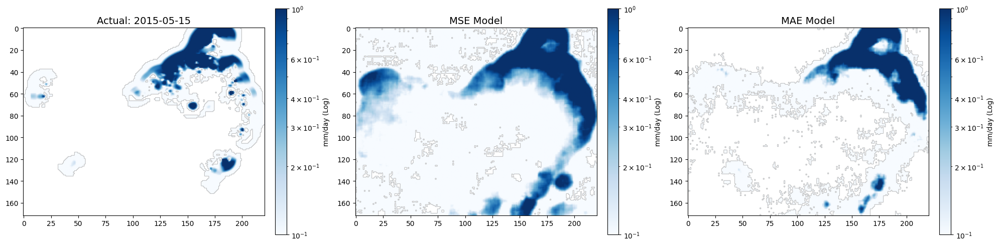

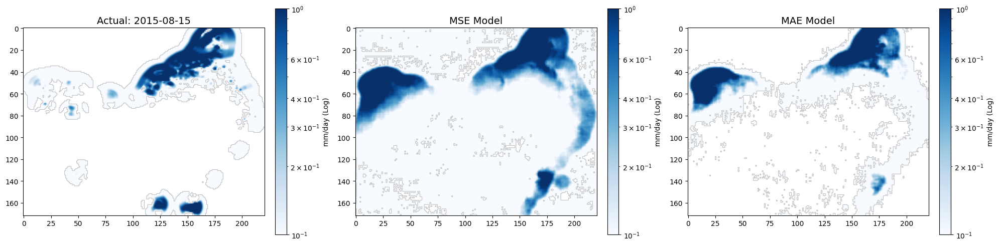

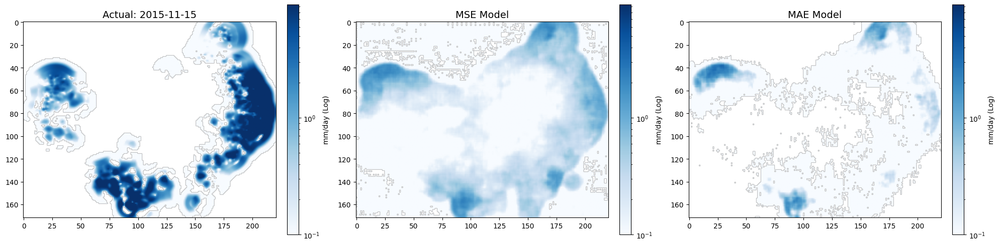

In [22]:
plot_comparison('2015-02-15')
plot_comparison('2015-05-15')
plot_comparison('2015-08-15')
plot_comparison('2015-11-15')

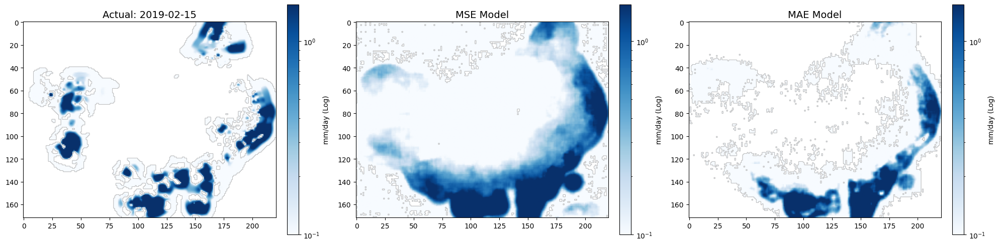

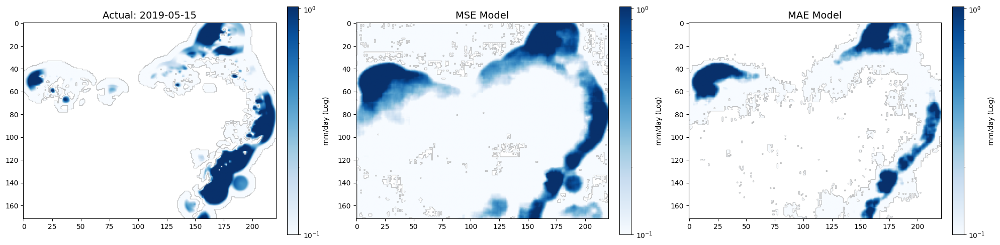

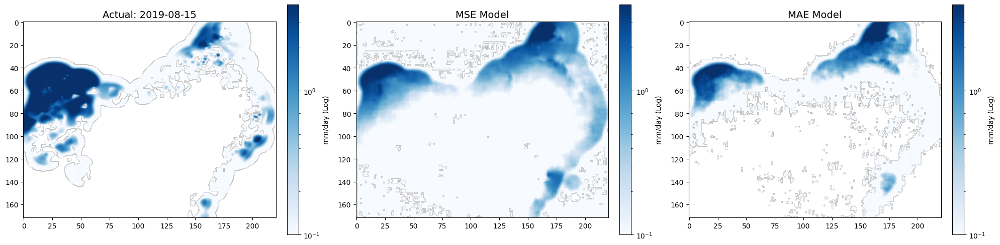

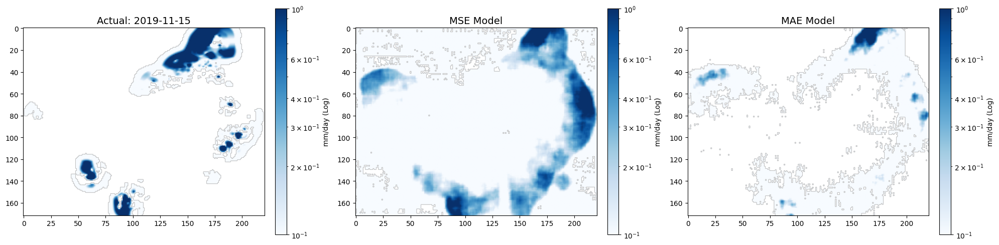

In [23]:
plot_comparison('2019-02-15')
plot_comparison('2019-05-15')
plot_comparison('2019-08-15')
plot_comparison('2019-11-15')

We see that the precipitation data are noisy and difficult to predict from temperature and vapour pressure alone. Since rainfall exhibits temporal persistence, we add precipitation from the previous day as an additional input feature. This lagged variable improves the model’s ability to capture short-term rainfall patterns.

Now add precipitation as lagged feature

In [24]:
# adds precip_lag1
def get_data_scalar_with_lag(start_year, end_year, is_train=False, stats=None):
    # Load same data as before
    data = ds[['tmax', 'tmin', 'vapourpres', 'precip']].sel(
        lat=slice(-44.5, -10),
        lon=slice(112, 156.5),
        time=slice(start_year, end_year)
    )

    # Add lag before coarsening
    data = data.assign(precip_lag1=data['precip'].shift(time=1))
    data = data.isel(time=slice(1, None))  # drop NaN first row

    # Coarsen
    data = data.coarsen(lat=4, lon=4, boundary="trim").mean().compute()

    # Features: same as original + new variable
    doy = data.time.dt.dayofyear
    doy_s = np.sin(2 * np.pi * doy / 365.0)
    doy_c = np.cos(2 * np.pi * doy / 365.0)

    weights = np.cos(np.deg2rad(data.lat))
    X_vars = ['tmax', 'tmin', 'vapourpres']

    X_list = [data[v].weighted(weights).mean(dim=["lat", "lon"]) for v in X_vars]

    # New feature global weighted precip_lag1
    X_list.append(
        data['precip_lag1'].weighted(weights).mean(dim=["lat","lon"])
    )

    # Seasonal features
    X_list.append(doy_s)
    X_list.append(doy_c)

    X = np.stack([x.values for x in X_list], axis=1)

    # Target stays the same
    y = np.log1p(data['precip'].values)

    # Normalize (same logic as original)
    if is_train:
        stats = (X.mean(axis=0), X.std(axis=0))
    X = (X - stats[0]) / stats[1]

    # keep time values for plotting later
    times = data.time.values

    return (
        torch.from_numpy(X.astype(np.float32)),
        torch.from_numpy(y.astype(np.float32)).unsqueeze(1),
        stats,
        times
    )

In [25]:
# Build new datasets for lag
X_train_lag, y_train_lag, lag_stats, times_train_lag = get_data_scalar_with_lag('1971', '2000', is_train=True)
X_val_lag,   y_val_lag,   _,        times_val_lag   = get_data_scalar_with_lag('2001', '2010', stats=lag_stats)
X_test_lag,  y_test_lag,  _,        times_test_lag  = get_data_scalar_with_lag('2011', '2019', stats=lag_stats)

# Build DataLoaders
train_dl_lag = DataLoader(TensorDataset(X_train_lag, y_train_lag), batch_size=16, shuffle=True)
val_dl_lag   = DataLoader(TensorDataset(X_val_lag,   y_val_lag),   batch_size=16)
test_dl_lag  = DataLoader(TensorDataset(X_test_lag,  y_test_lag),  batch_size=16)

# Build new models (input_dim = X_train_lag.shape[1])
input_dim_lag = X_train_lag.shape[1]

model_mse_lag = make_CNN_model(input_dim_lag).to(DEVICE)
model_mae_lag = make_CNN_model(input_dim_lag).to(DEVICE)

opt_mse_lag = torch.optim.Adam(model_mse_lag.parameters(), lr=1e-4)
opt_mae_lag = torch.optim.Adam(model_mae_lag.parameters(), lr=1e-4)

Train models with lagged feature

Epoch 01 | MSE: 0.3608/0.3085 | MAE: 0.2330/0.2068
Epoch 02 | MSE: 0.3008/0.2931 | MAE: 0.2128/0.2031
Epoch 03 | MSE: 0.2892/0.2874 | MAE: 0.2100/0.2015
Epoch 04 | MSE: 0.2839/0.2848 | MAE: 0.2086/0.2017
Epoch 05 | MSE: 0.2809/0.2831 | MAE: 0.2077/0.2005
Epoch 06 | MSE: 0.2788/0.2814 | MAE: 0.2072/0.2000
Epoch 07 | MSE: 0.2774/0.2807 | MAE: 0.2067/0.1999
Epoch 08 | MSE: 0.2762/0.2800 | MAE: 0.2063/0.2003
Epoch 09 | MSE: 0.2754/0.2795 | MAE: 0.2059/0.1995
Epoch 10 | MSE: 0.2746/0.2789 | MAE: 0.2057/0.1997
Epoch 11 | MSE: 0.2740/0.2791 | MAE: 0.2054/0.1995
Epoch 12 | MSE: 0.2735/0.2783 | MAE: 0.2052/0.1992
Epoch 13 | MSE: 0.2729/0.2785 | MAE: 0.2050/0.1991
Epoch 14 | MSE: 0.2725/0.2785 | MAE: 0.2048/0.1991
Epoch 15 | MSE: 0.2722/0.2777 | MAE: 0.2047/0.1995
Epoch 16 | MSE: 0.2716/0.2776 | MAE: 0.2045/0.1990
Epoch 17 | MSE: 0.2714/0.2777 | MAE: 0.2044/0.1989
Epoch 18 | MSE: 0.2711/0.2779 | MAE: 0.2042/0.2002
Epoch 19 | MSE: 0.2709/0.2777 | MAE: 0.2041/0.1987
Epoch 20 | MSE: 0.2706/0.2767 |

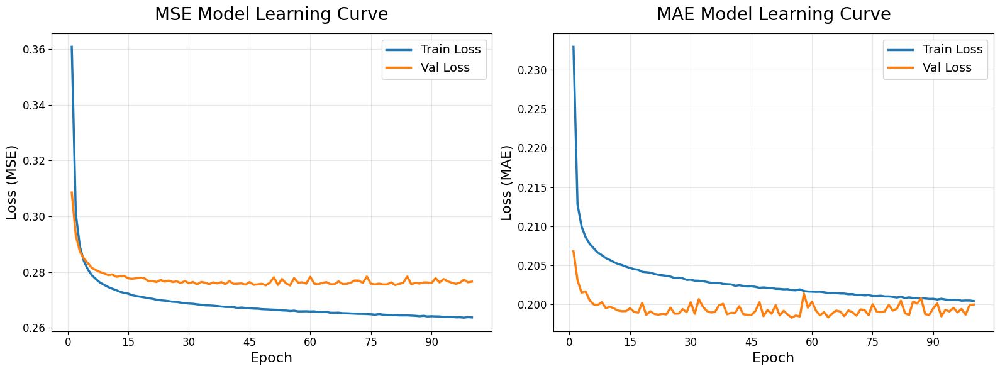

In [26]:
# Train both models with lag featured
N_EPOCHS = 100
mse_train_hist_lag, mse_val_hist_lag = [], []
mae_train_hist_lag, mae_val_hist_lag = [], []

for epoch in range(N_EPOCHS):

    # MSE TRAIN
    model_mse_lag.train()
    losses = []
    for Xb, yb in train_dl_lag:
        Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)
        opt_mse_lag.zero_grad()
        pred = model_mse_lag(Xb)
        loss = crit_mse(pred, yb)
        loss.backward()
        opt_mse_lag.step()
        losses.append(loss.item())
    train_mse = np.mean(losses)

    # MSE VAL
    model_mse_lag.eval()
    losses = []
    with torch.no_grad():
        for Xb, yb in val_dl_lag:
            Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)
            vloss = crit_mse(model_mse_lag(Xb), yb)
            losses.append(vloss.item())
    val_mse = np.mean(losses)

    mse_train_hist_lag.append(train_mse)
    mse_val_hist_lag.append(val_mse)

    # MAE TRAIN
    model_mae_lag.train()
    losses = []
    for Xb, yb in train_dl_lag:
        Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)
        opt_mae_lag.zero_grad()
        pred = model_mae_lag(Xb)
        loss = crit_mae(pred, yb)
        loss.backward()
        opt_mae_lag.step()
        losses.append(loss.item())
    train_mae = np.mean(losses)

    # MAE VAL
    model_mae_lag.eval()
    losses = []
    with torch.no_grad():
        for Xb, yb in val_dl_lag:
            Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)
            vloss = crit_mae(model_mae_lag(Xb), yb)
            losses.append(vloss.item())
    val_mae = np.mean(losses)

    mae_train_hist_lag.append(train_mae)
    mae_val_hist_lag.append(val_mae)

    print(f"Epoch {epoch+1:02d} | "
          f"MSE: {train_mse:.4f}/{val_mse:.4f} | "
          f"MAE: {train_mae:.4f}/{val_mae:.4f}")

# Plot learning curves
plot_histories_side_by_side(
    mse_train_hist_lag, mse_val_hist_lag,
    mae_train_hist_lag, mae_val_hist_lag
)

Calculate RMSE

In [27]:
print("Weighted RMSE for lag models:")

train_rmse_mae_lag = compute_rmse(model_mae_lag, train_dl_lag, DEVICE, weights)
val_rmse_mae_lag   = compute_rmse(model_mae_lag, val_dl_lag,   DEVICE, weights)
test_rmse_mae_lag  = compute_rmse(model_mae_lag, test_dl_lag,  DEVICE, weights)

print("MAE-lag Model:")
print(f"Train RMSE: {train_rmse_mae_lag:.4f}")
print(f"Val   RMSE: {val_rmse_mae_lag:.4f}")
print(f"Test  RMSE: {test_rmse_mae_lag:.4f}")

train_rmse_mse_lag = compute_rmse(model_mse_lag, train_dl_lag, DEVICE, weights)
val_rmse_mse_lag   = compute_rmse(model_mse_lag, val_dl_lag,   DEVICE, weights)
test_rmse_mse_lag  = compute_rmse(model_mse_lag, test_dl_lag,  DEVICE, weights)

print("MSE-lag Model:")
print(f"Train RMSE: {train_rmse_mse_lag:.4f}")
print(f"Val   RMSE: {val_rmse_mse_lag:.4f}")
print(f"Test  RMSE: {test_rmse_mse_lag:.4f}")

Weighted RMSE for lag models:
MAE-lag Model:
Train RMSE: 0.5501
Val   RMSE: 0.5624
Test  RMSE: 0.5537
MSE-lag Model:
Train RMSE: 0.5132
Val   RMSE: 0.5257
Test  RMSE: 0.5166


Note: The lagged precip and no lagged almost have the exact same RMSE for both MAE and MSE model. However, we still see very slight improvement in both MAE and MSE.

RMSE Test for MSE is 0.5230, MSE Lag is 0.5166
RMSE Test for MAE is 0.5599, MAE Lag is 0.5537

These differences are small but systematic, indicating that including precipitation from the previous day provides additional useful predictive information.

However, the improvement remains limited for two key reasons:
	1.	The lag feature is a single global-average scalar, not a spatial map.
It tells the model “how wet yesterday was overall,” but gives no information about where rainfall occurred.
	2.	The model still attempts to reconstruct a full spatial precipitation field from a handful of large-scale global predictors.
Because spatial rainfall patterns vary sharply across Australia and are dominated by local dynamics, a single global lag adds only minor benefit.

In [28]:
def plot_comparison_lag(date_str):
    # Times from LAG test set
    str_times = np.array([str(t).split('T')[0] for t in times_test_lag])
    idx = np.where(str_times == date_str)[0][0]

    # Select sample (Lag data)
    X_in = X_test_lag[idx].unsqueeze(0).to(DEVICE)
    y_true = y_test_lag[idx].unsqueeze(0)

    # Predictions (Lag models)
    with torch.no_grad():
        p_mse = model_mse_lag(X_in).cpu()
        p_mae = model_mae_lag(X_in).cpu()

    # Back to mm/day
    t_mm = np.expm1(y_true[0, 0].numpy())
    m_mm = np.expm1(p_mse[0, 0].numpy())
    a_mm = np.expm1(p_mae[0, 0].numpy())

    # Robust colorbar from true field
    vmax = np.percentile(t_mm, 95)
    if vmax < 1:
        vmax = 1.0

    fig, ax = plt.subplots(1, 3, figsize=(20, 5))

    # Actual (lag dataset)
    im0 = ax[0].imshow(t_mm, cmap='Blues', norm=LogNorm(vmin=0.1, vmax=vmax))
    ax[0].set_title(f"Actual (lag): {date_str}", fontsize=14)
    cbar0 = plt.colorbar(im0, ax=ax[0], fraction=0.046, pad=0.04)
    cbar0.set_label("mm/day (Log)")

    # MSE-lag
    im1 = ax[1].imshow(m_mm, cmap='Blues', norm=LogNorm(vmin=0.1, vmax=vmax))
    ax[1].set_title("MSE-lag Model", fontsize=14)
    cbar1 = plt.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)
    cbar1.set_label("mm/day (Log)")

    # MAE-lag
    im2 = ax[2].imshow(a_mm, cmap='Blues', norm=LogNorm(vmin=0.1, vmax=vmax))
    ax[2].set_title("MAE-lag Model", fontsize=14)
    cbar2 = plt.colorbar(im2, ax=ax[2], fraction=0.046, pad=0.04)
    cbar2.set_label("mm/day (Log)")

    plt.tight_layout()
    plt.show()

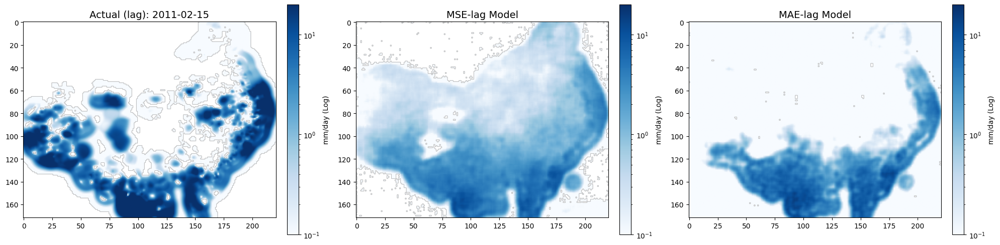

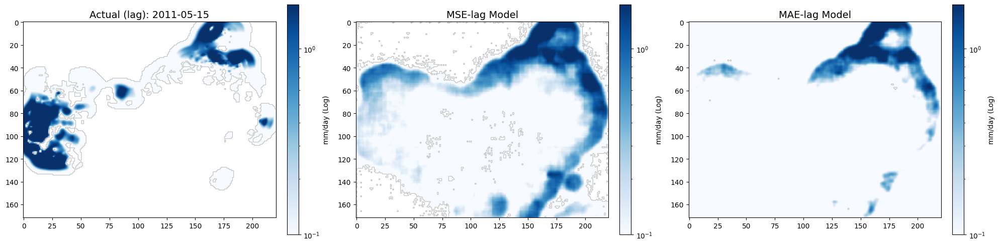

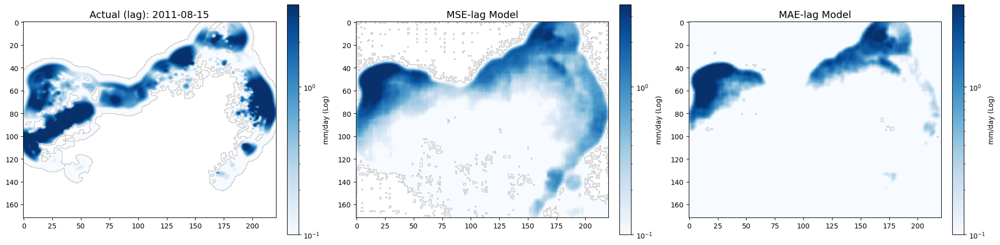

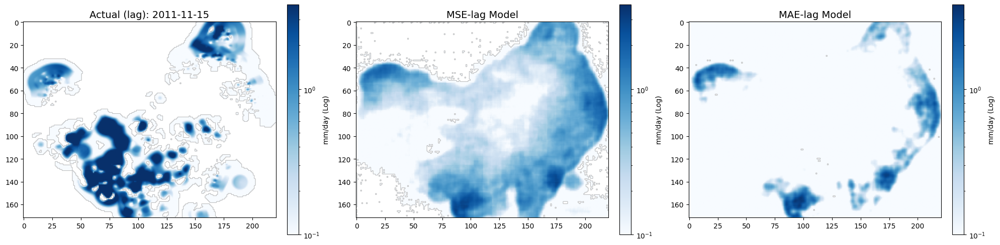

In [29]:
plot_comparison_lag('2011-02-15')
plot_comparison_lag('2011-05-15')
plot_comparison_lag('2011-08-15')
plot_comparison_lag('2011-11-15')

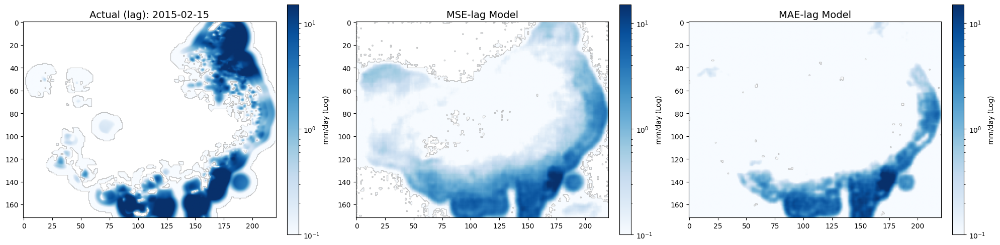

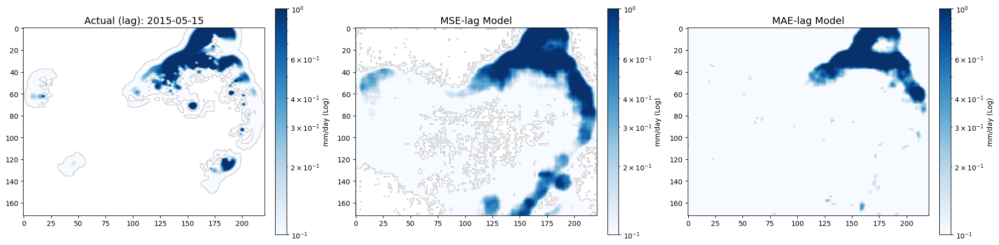

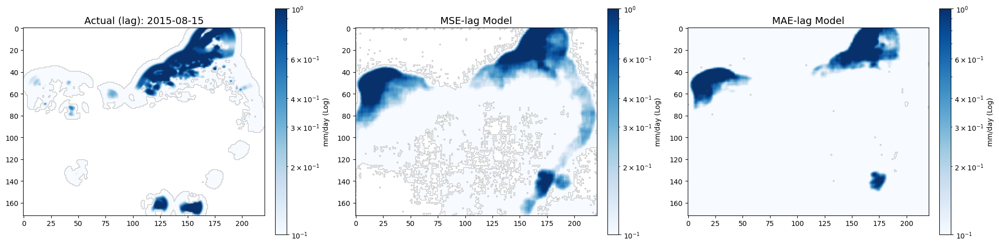

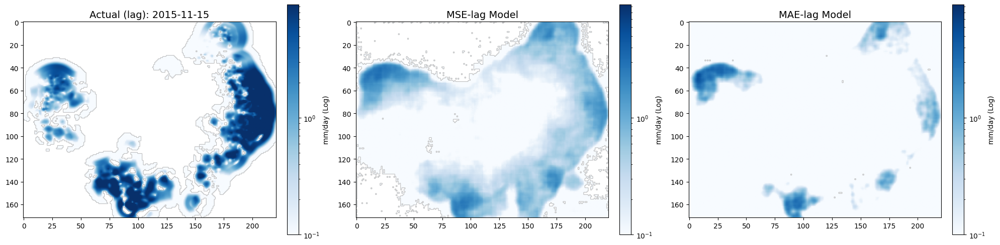

In [30]:
plot_comparison_lag('2015-02-15')
plot_comparison_lag('2015-05-15')
plot_comparison_lag('2015-08-15')
plot_comparison_lag('2015-11-15')

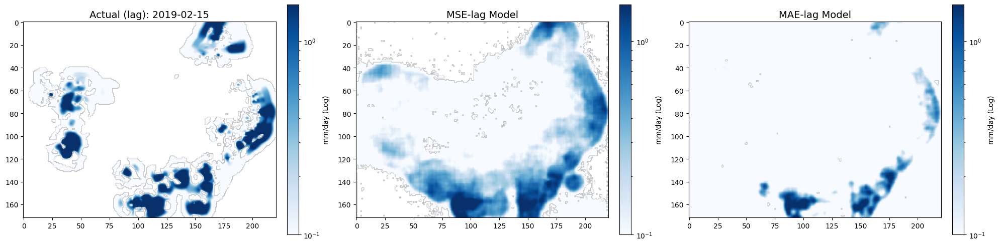

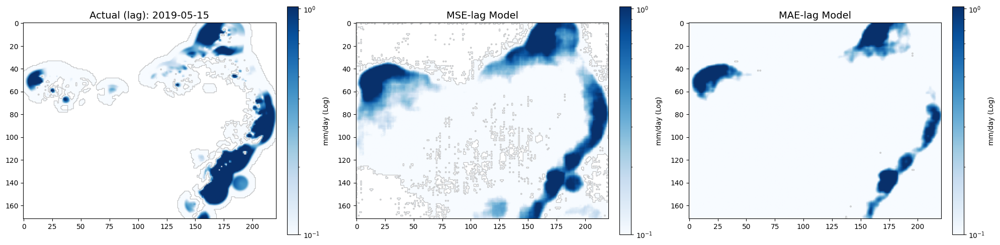

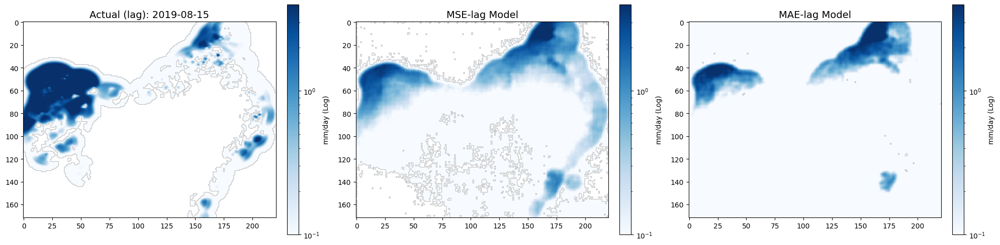

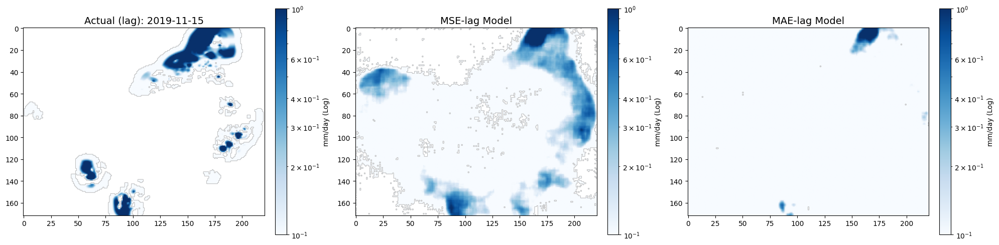

In [31]:
plot_comparison_lag('2019-02-15')
plot_comparison_lag('2019-05-15')
plot_comparison_lag('2019-08-15')
plot_comparison_lag('2019-11-15')

We also want to plot the lagged and no lagged side by side

In [32]:
def plot_comparison_both(date_str):
    # Get time index from NO-LAG test
    str_times = np.array([str(t).split('T')[0] for t in times_test])
    idx = np.where(str_times == date_str)[0][0]

    # Inputs
    X_nl  = X_test[idx].unsqueeze(0).to(DEVICE)
    y_nl  = y_test[idx].unsqueeze(0)

    X_lag = X_test_lag[idx].unsqueeze(0).to(DEVICE)
    y_lag = y_test_lag[idx].unsqueeze(0)

    # Predictions
    with torch.no_grad():
        p_mse_nl = model_mse(X_nl).cpu()
        p_mae_nl = model_mae(X_nl).cpu()

        p_mse_lag = model_mse_lag(X_lag).cpu()
        p_mae_lag = model_mae_lag(X_lag).cpu()

    # Convert to mm/day
    t_mm = np.expm1(y_nl[0,0].numpy())
    mse_nl = np.expm1(p_mse_nl[0,0].numpy())
    mae_nl = np.expm1(p_mae_nl[0,0].numpy())
    mse_lag = np.expm1(p_mse_lag[0,0].numpy())
    mae_lag = np.expm1(p_mae_lag[0,0].numpy())

    vmax = np.percentile(t_mm, 95)
    if vmax < 1:
        vmax = 1

    fig, ax = plt.subplots(2, 3, figsize=(22, 12))

    # Row 1 (Actual + No-Lag)
    im0 = ax[0,0].imshow(t_mm, cmap='Blues', norm=LogNorm(vmin=0.1, vmax=vmax))
    ax[0,0].set_title(f"Actual: {date_str}", fontsize=14)
    plt.colorbar(im0, ax=ax[0,0], fraction=0.046, pad=0.04)

    im1 = ax[0,1].imshow(mse_nl, cmap='Blues', norm=LogNorm(vmin=0.1, vmax=vmax))
    ax[0,1].set_title("No-Lag MSE", fontsize=14)
    plt.colorbar(im1, ax=ax[0,1], fraction=0.046, pad=0.04)

    im2 = ax[0,2].imshow(mae_nl, cmap='Blues', norm=LogNorm(vmin=0.1, vmax=vmax))
    ax[0,2].set_title("No-Lag MAE", fontsize=14)
    plt.colorbar(im2, ax=ax[0,2], fraction=0.046, pad=0.04)

    # Row 2 (Lagged Models)
    im3 = ax[1,1].imshow(mse_lag, cmap='Blues', norm=LogNorm(vmin=0.1, vmax=vmax))
    ax[1,1].set_title("Lagged MSE", fontsize=14)
    plt.colorbar(im3, ax=ax[1,1], fraction=0.046, pad=0.04)

    im4 = ax[1,2].imshow(mae_lag, cmap='Blues', norm=LogNorm(vmin=0.1, vmax=vmax))
    ax[1,2].set_title("Lagged MAE", fontsize=14)
    plt.colorbar(im4, ax=ax[1,2], fraction=0.046, pad=0.04)

    # Empty title panel
    ax[1,0].axis("off")
    ax[1,0].text(0.5, 0.5, "Lag vs No-Lag Comparison", ha='center', va='center', fontsize=16)

    plt.tight_layout()
    plt.show()

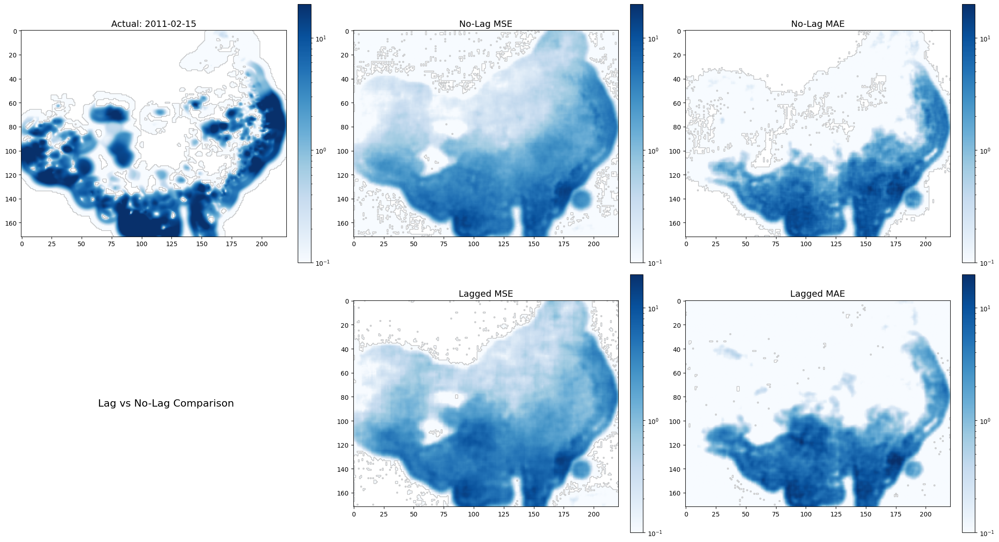

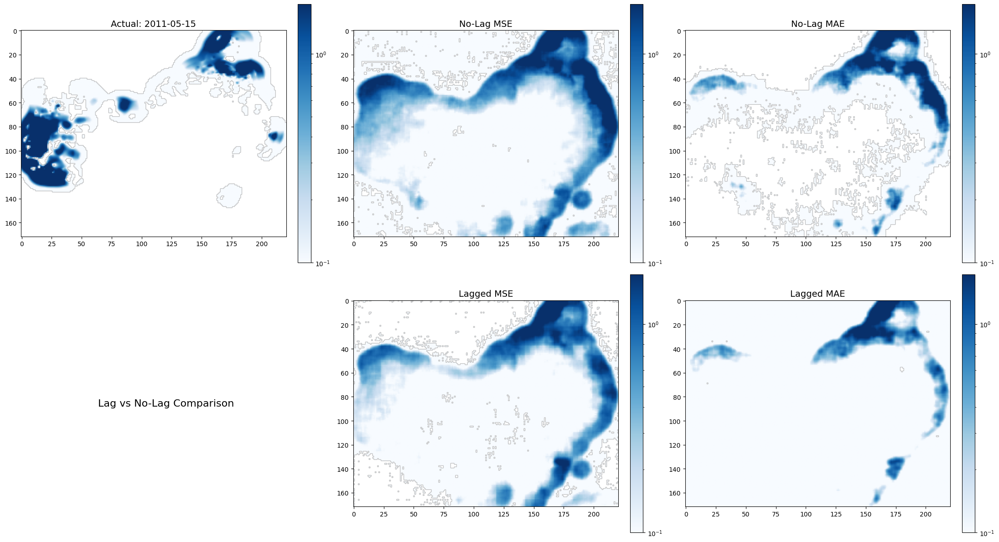

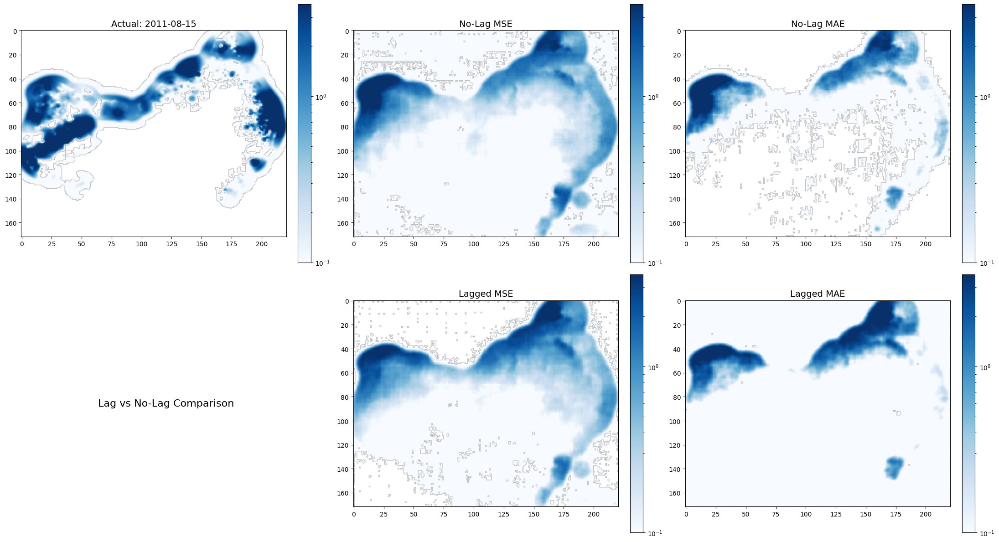

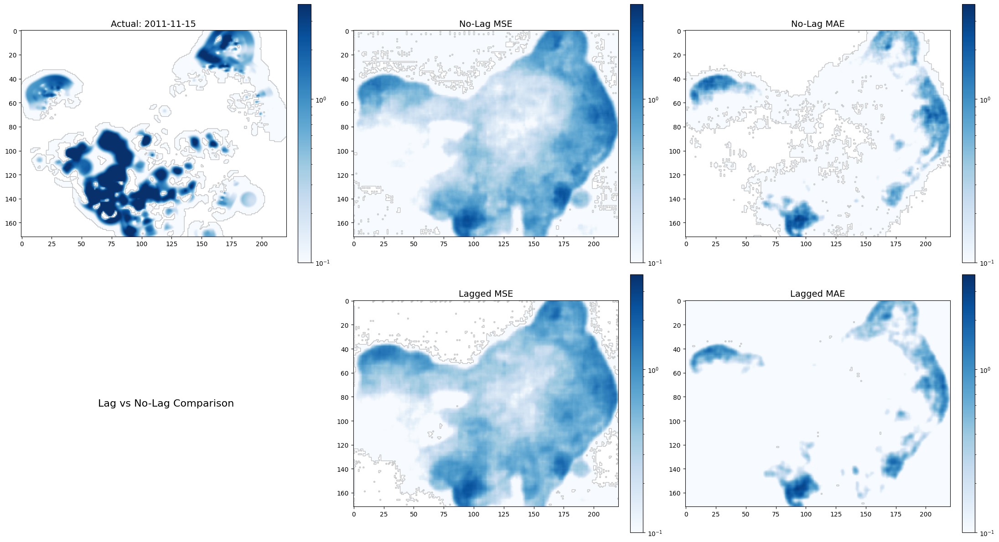

In [33]:
plot_comparison_both('2011-02-15')
plot_comparison_both('2011-05-15')
plot_comparison_both('2011-08-15')
plot_comparison_both('2011-11-15')